In [7]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.spatial import ConvexHull
from shapely.geometry import Polygon, Point, box, LineString
from shapely.affinity import rotate, scale
import warnings
from shapely.ops import split
from typing import Optional, Tuple
import time
import pickle
from util import *

# Final optimización

## El problema

### Problema de Hammer:
Supongamos que hay un agujero convexo en un sólido homogéneo y que tomamos imágenes de rayos X que son tan precisas que su "intensidad" en cada punto determina la longitud de una cuerda a lo largo de una recta. ¿Cuántas imágenes se deberían tomar para permitir la reconstrucción exacta del cuerpo si los rayos se asumen paralelos?

Esta pregunta sirvió de inspiración para el desarrollo de la **geometría tomográfica**.

Asumimos cuerpos convexos planos (compactos con interior no vacío) contenidos en la bola unitaria.

Los rayos X paralelos de un cuerpo convexo $K$ en la dirección $u$ es la función que nos da las longitudes de todas las cuerdas de $K$ paralelas a $u$.

$$
    X_{u} K(t)=\int_{l_{u}+t v} 1_{K}(y) d y
$$

La unicidad de las preguntas anteriores es equivalente a preguntarnos qué conjuntos finitos de direcciones cumplen la propiedad de que los rayos X paralelos a las mismas distinguen entre distintos cuerpos convexos.

La respuesta es que existen conjuntos de 4 vectores que cumplen esa propiedad. Elegimos 4 cualesquiera, los normalizamos, los fijamos y los llamamos $u_i$ para $i=0,...3$. Llamamos $v_i$ a sus ortogonales.

Ahora supongamos que tenemos un cuerpo convexo arbitrario $K$ junto con las mediciones de sus rayos X paralelos a los $u_i$ (que tienen un cierto ruido modelado por gaussianas i.i.d.) en una grilla. Esta la vamos a representar en una matriz $M$ de tamaño $k \cdot 4$ con $k$ el tamaño de la grilla.
$$
    M_{j}^{(i)}=X_{u_{i}} K_{0}\left(t_{j}\right)+N_{j}^{(i)}
$$
Más concretamente:

In [8]:
potato = UnknownObject()
M = potato.noisy_measurements(k=10)
M

array([[-5.33095012e-05, -5.33095012e-05, -5.33095012e-05,
        -5.33095012e-05,  9.77798428e-01,  9.77798428e-01,
        -5.33095012e-05, -5.33095012e-05, -5.33095012e-05,
        -5.33095012e-05],
       [-5.33095012e-05, -5.33095012e-05, -5.33095012e-05,
         3.64981034e-01,  6.10613432e-01,  6.10613432e-01,
         3.64981034e-01, -5.33095012e-05, -5.33095012e-05,
        -5.33095012e-05],
       [-5.33095012e-05, -5.33095012e-05,  1.78166127e-01,
         3.53980077e-01,  4.14954933e-01,  4.14954933e-01,
         3.53980077e-01,  1.78166127e-01, -5.33095012e-05,
        -5.33095012e-05],
       [-5.33095012e-05, -5.33095012e-05, -5.33095012e-05,
         3.82944776e-01,  4.91822665e-01,  4.91822665e-01,
         3.82944776e-01, -5.33095012e-05, -5.33095012e-05,
        -5.33095012e-05]])

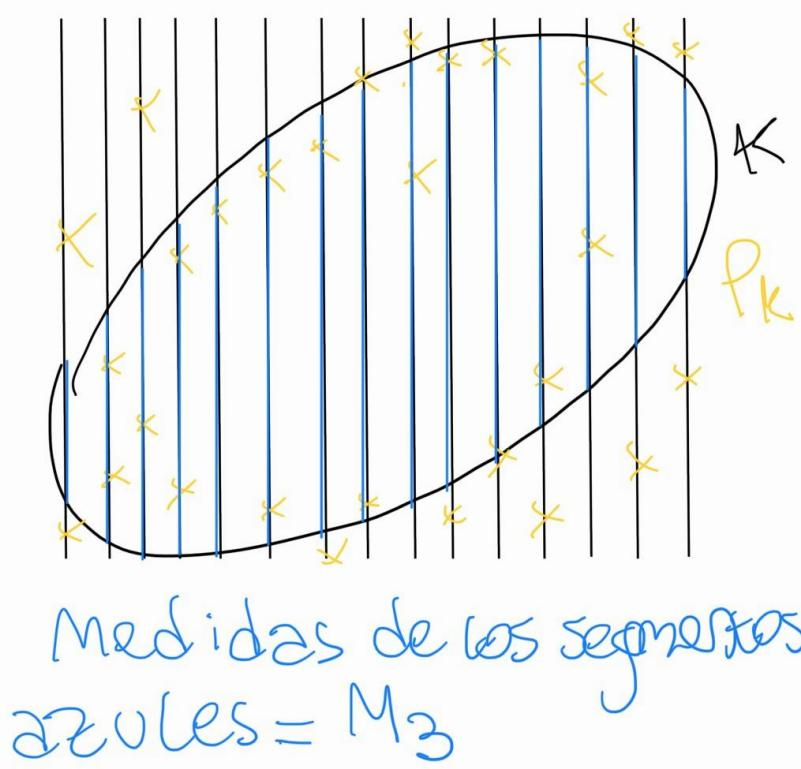

¿Podemos encontrar el polígono que mejor aproxima a $K$?

**¡Sí!**

Supongamos que $z_i$ son puntos en los rayos X paralelos de $K$ (dos en cada rayo). Llamamos $P[z_k]$ a la cápsula convexa del conjunto de todos ellos (que tiene $8k$ elementos). El *paper* en el que nos basamos nos dice que podemos resolver el problema 
$$
    \min _{z_{k} \in[-1,1]^{8 k}} \sum_{i=1}^{4} \sum_{j=1}^{k}\left(M_{j}^{(i)}-X_{u_{i}} P\left[z_{k}\right]\left(t_{j}\right)\right)^{2}
$$

Ahora tenemos que buscar cómo resolver este problema de cuadrados mínimos no lineal...

## Marco de experimentación

Nuestros objetos de experimentación van a ser elipses:

In [10]:
class UnknownObject:
    def __init__(self, std_dev=0.01):
        self._a = np.random.uniform(0, 0.99)
        self._b = np.random.uniform(0, 0.99)
        self._angle = np.random.uniform(0, 90)
        self._std_dev = std_dev

    def object(self):
        aux_circle = Point((0,0)).buffer(1)
        ellipse  = scale(aux_circle, self._a, self._b)
        ellipse_rotated = rotate(ellipse, self._angle)
        if any(abs(bound)>1 for bound in ellipse_rotated.bounds):
            warnings.warn("Object does not fit in S1")
        return ellipse_rotated
        
    def noisy_measurements(self, k: int) -> np.ndarray:
        noise = np.random.normal(0, self._std_dev**2)
        t = np.linspace(-1, 1, k)
        return np.array([[x_ray_for(i, self.object(), t[j]) + noise for j in range(k)] for i in range(4)]) 

Modelamos nuestros experimentos de la siguiente forma:

In [3]:
class Experiment:
    def __init__(self, optimizer, params, ellipse):
        self.optimizer = optimizer
        self.params = params
        self.ellipse = ellipse

    def run(self):
        return self.optimizer(*self.params)

El resultado de correr un experimento tiene los siguientes atributos:

In [4]:
class Result:
    def __init__(self, experiment, duration, evolution, poly):
        self.experiment = experiment
        self.duration = duration
        self.evolution = [value['objective_function'] for value in evolution]
        self.polygons = [value['polygon'] for value in evolution]
        self.poly = poly

Ahora ya podemos correr experimentos eligiendo un optimizador, unos parámetros y una elipse a aproximar y guardar los resultados en un objeto que tiene una interfaz conocida.

In [ ]:
tries = 10
results = []
for i in range(tries):
    potato = UnknownObject()
    M = potato.noisy_measurements(k=100)
    k = M.shape[1]
    s_0 = random_s(k)
    params = [M, 100, 50, s_0, 0.1, 0.05]
    experiment = Experiment(iterated_local_search, params, potato)
    beginning = time()
    poly, evolution = experiment.run()
    end = time()
    duration = end - beginning
    results.append(Result(experiment, duration, evolution, poly))

with open('data.pickle', 'wb') as f:
    pickle.dump(results, open(f"ils_{params[1]}_{params[2]}_1.pkl", 'wb'))

# Optimización

¿Qué estamos intentando optimizar?

Tenemos los rayos X (ruidosos) paralelos a cuatro direcciones $u_i$ para un cuerpo convexo plano.

$$
M_j^{(i)}=X_{u_i} K_0\left(t_j\right)+N_j^{(i)}
$$
con $N_j^{(i)}$ normales iid de media 0 y
$$
X_u K(t)=\int_{l_u+t v} 1_K(y) d y
$$

Queremos encontrar el polígono que mejor lo aproxima. Función objetivo:
$$
\min _{z_k \in[-1,1]^{8 k}} \sum_{i=1}^4 \sum_{j=1}^k\left(M_j^{(i)}-X_{u_i} P\left[z_k\right]\left(t_j\right)\right)^2
$$


In [5]:
def obj_function(M: np.ndarray, polygon: Polygon) -> float:
    k = M.shape[1]
    t = np.linspace(-1, 1, k)
    sum_of_squares = 0
    for i in range(4):
        sum_of_squares_for_u_i = 0
        for j in range(k):
            sum_of_squares_for_u_i += (M[i, j] - x_ray_for(i, polygon, t[j]))**2
        sum_of_squares += sum_of_squares_for_u_i
    return sum_of_squares


def x_ray_for(i: int, figure: Polygon, t_j: float) -> float:
    line = line_parallel_to_ui_on_tj(i, t_j)
    extended_line = extend(line)
    intersection = extended_line.intersection(figure).boundary.geoms
    if len(intersection) == 0:
        return 0
    else:
        return intersection[0].distance(intersection[-1])

¿Cómo lo hicimos?

## Parametrización de las soluciones

## Opción 1:

Para
$$u_0 = (1, 0) \\ 
u_1 = (2, 1) \\
u_2 = (0,1) \\
u_3 = (-1, 2)$$
(normalizados)
y los $v_i$ correspondientes ortogonales, intentamos buscar la mejor ubicación de los vértices del polígono sobre los rayos paralelos a $u_i$:

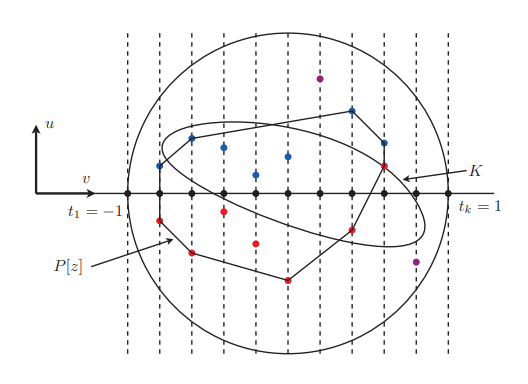

Empezamos con $4k$ puntos al azar y los vamos moviendo utilizando búsqueda local iterada. Siempre usamos la cápsula convexa. Si hay dos puntos muy cercanos que degeneran el polígono, los sacamos.

**Desventaja**: algoritmo muy conservador. 

### Resultados

In [6]:
from iterated_local_search import iterated_local_search
with open('results/ils_200_50.pkl', 'rb') as f:
    ils_200_50 = pickle.load(f)
with open('results/ils_100_50.pkl', 'rb') as f:
    ils_100_50 = pickle.load(f)

Tiempo: 03:12:31
Objeto a aproximar:


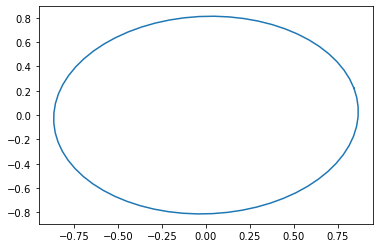

Evolución de la función objetivo:


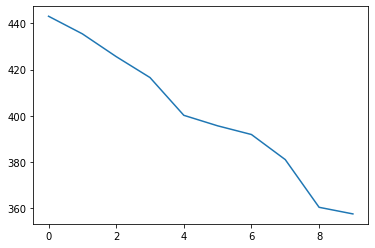

Evolución:


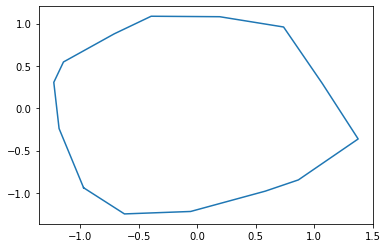

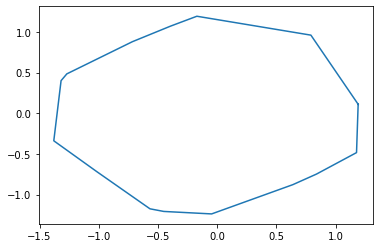

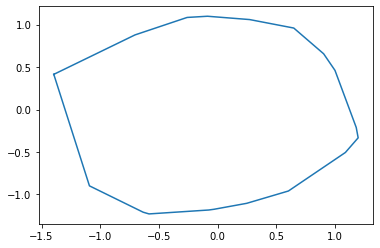

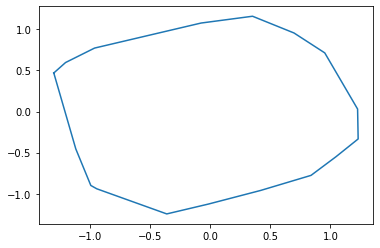

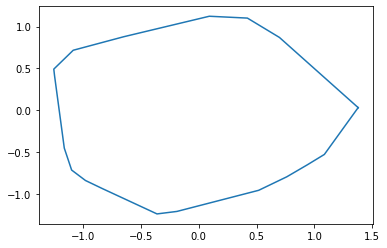

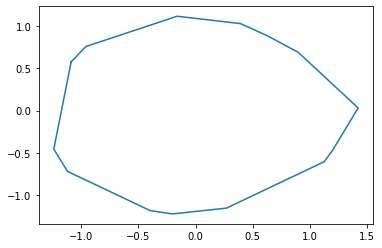

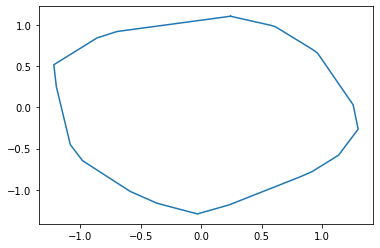

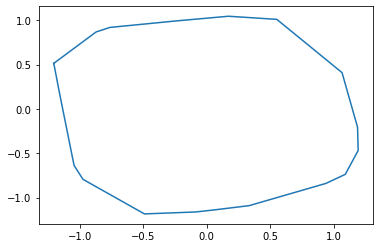

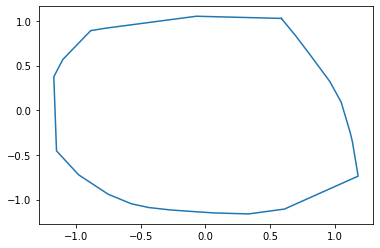

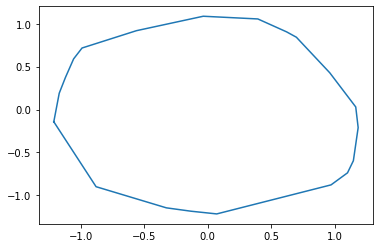

In [8]:
ils_200_50[0].summary()

Tiempo: 03:12:11
Objeto a aproximar:


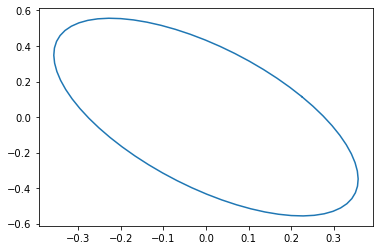

Evolución de la función objetivo:


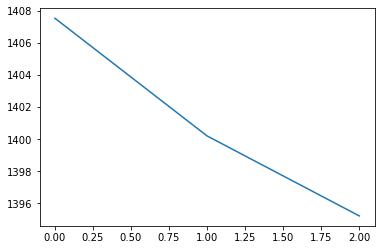

Evolución:


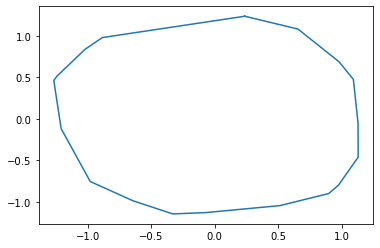

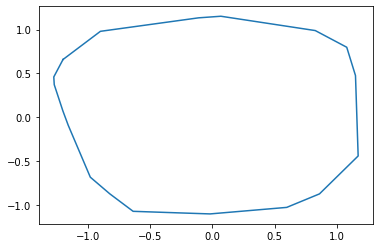

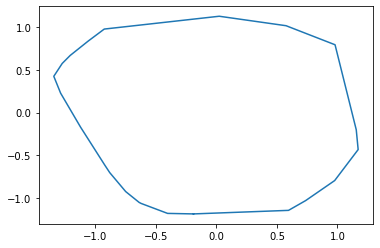

In [10]:
ils_200_50[1].summary()

Tiempo: 03:26:44
Objeto a aproximar:


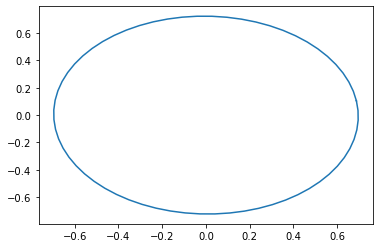

Evolución de la función objetivo:


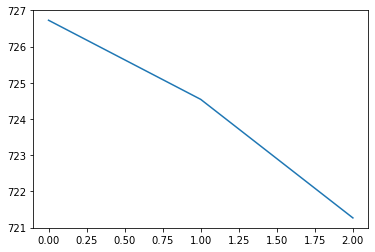

Evolución:


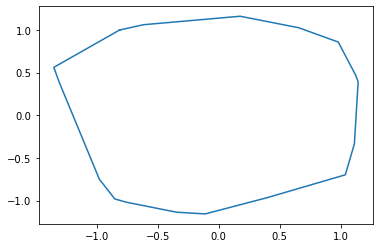

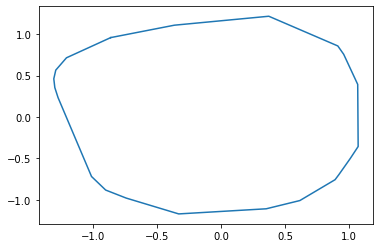

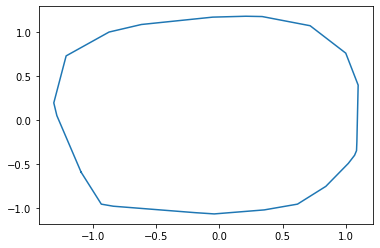

In [20]:
ils_200_50[2].summary()

Tiempo: 03:09:05
Objeto a aproximar:


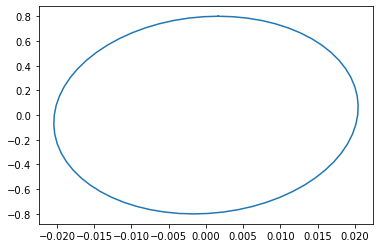

Evolución de la función objetivo:


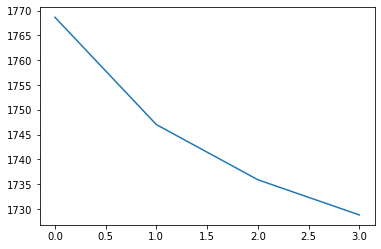

Evolución:


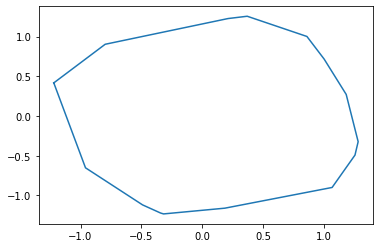

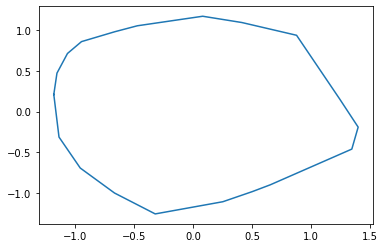

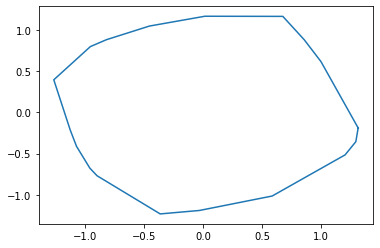

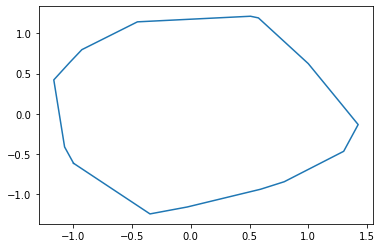

In [24]:
ils_200_50[3].summary()

Tiempo: 03:09:12
Objeto a aproximar:


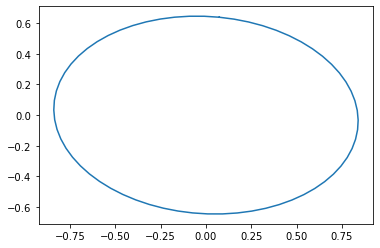

Evolución de la función objetivo:


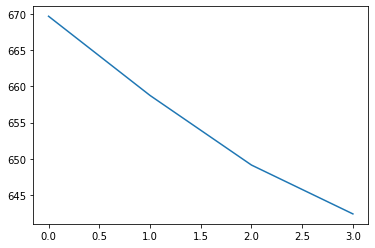

Evolución:


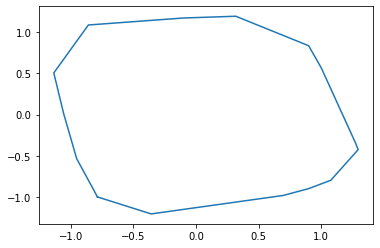

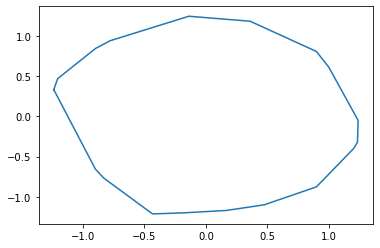

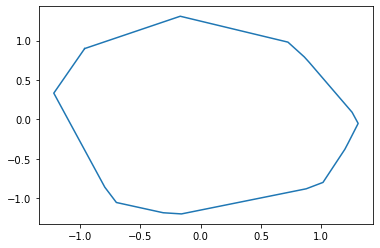

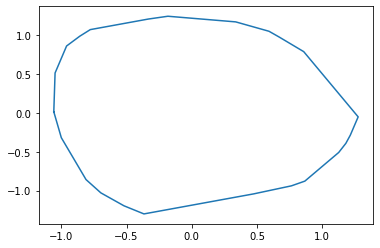

In [25]:
ils_200_50[4].summary()

## Opción 2:

Lo mismo, con recocido simulado. Para descender la temperatura probamos con:

In [11]:
def fast_annealing(T, iter):
    return T/(iter+1)

In [ ]:
def scalar_annealing(T, iter):
    return 0.8*T

**Desventajas**: Muy lento.

### Resultados

In [28]:
from simulated_annealing import simulated_annealing, scalar_annealing
with open('results/sa_25000_10000.pkl', 'rb') as f:
    sa = pickle.load(f)

Tiempo: 03:51:38
Objeto a aproximar:


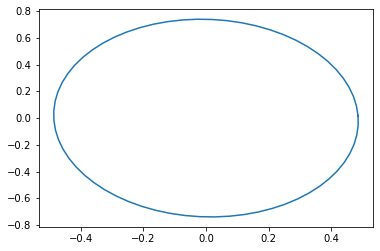

Evolución de la función objetivo:


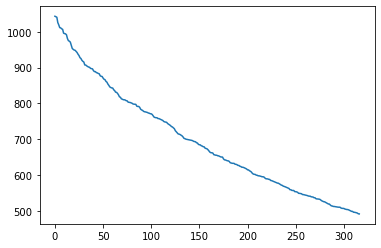

Evolución:


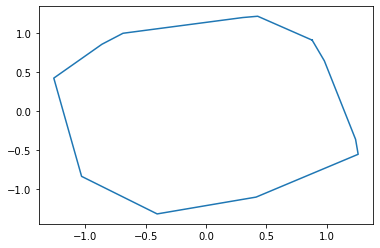

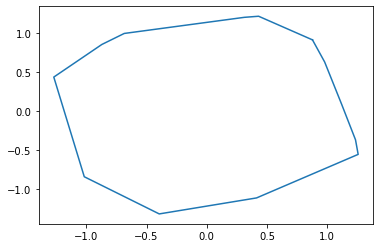

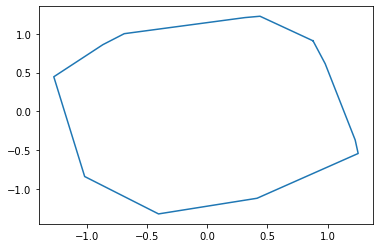

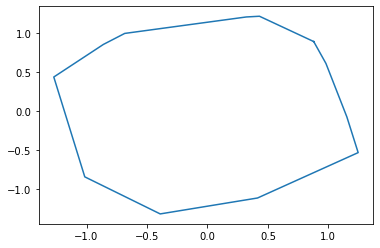

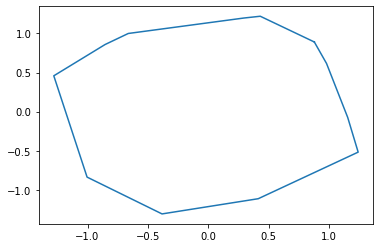

...

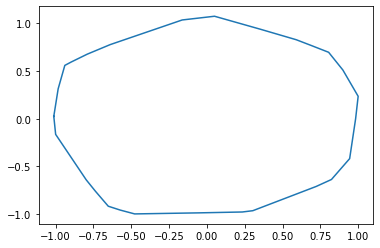

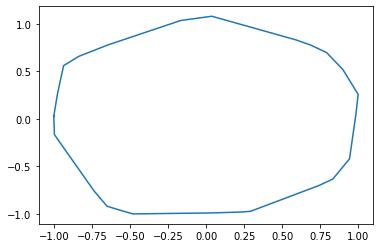

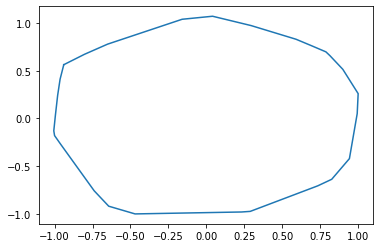

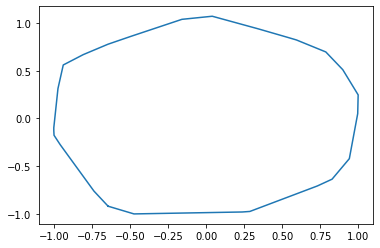

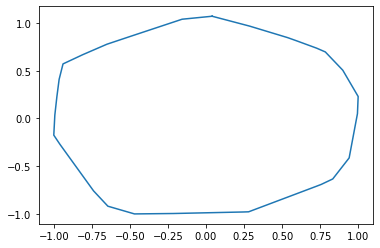

In [32]:
sa[2].summary()

Tiempo: 03:00:31
Objeto a aproximar:


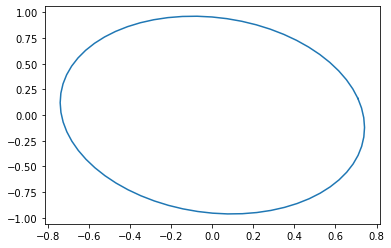

Evolución de la función objetivo:


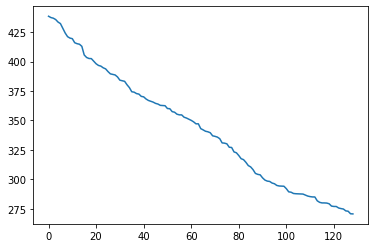

Evolución:


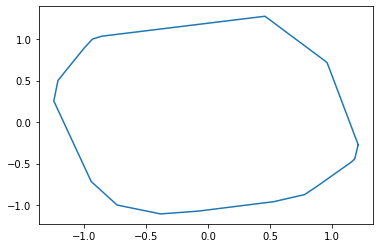

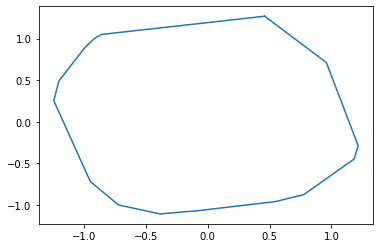

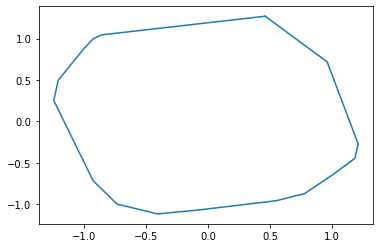

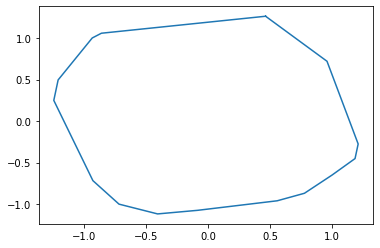

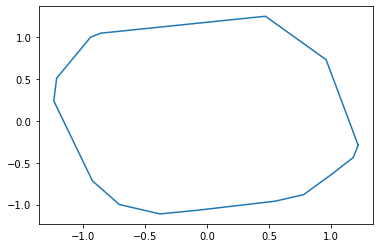

...

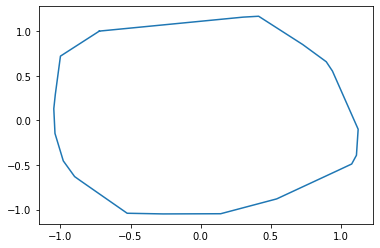

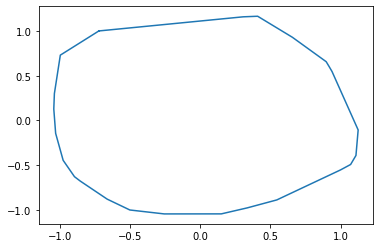

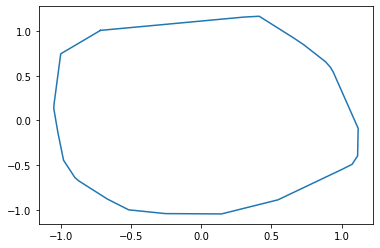

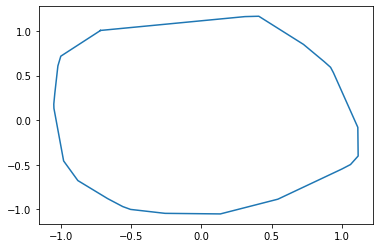

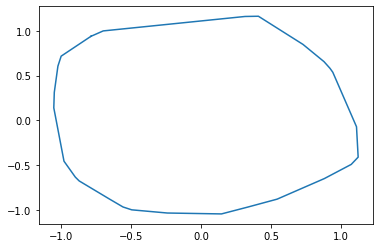

In [33]:
sa[3].summary()

Tiempo: 03:29:33
Objeto a aproximar:


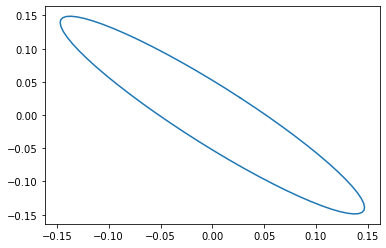

Evolución de la función objetivo:


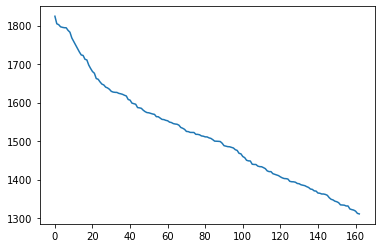

Evolución:


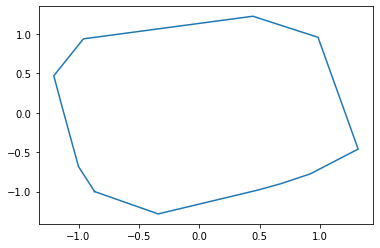

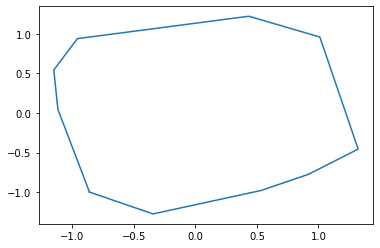

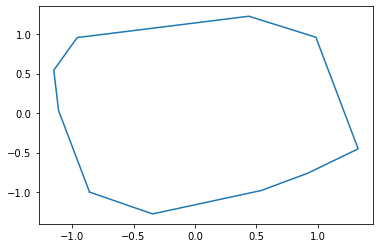

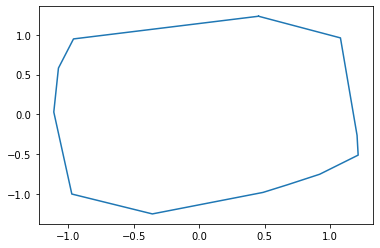

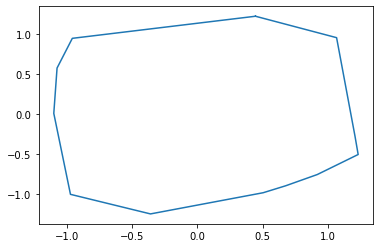

...

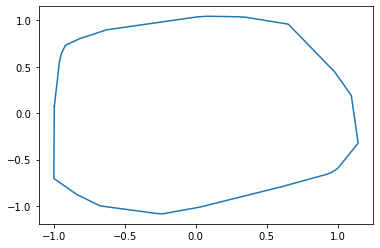

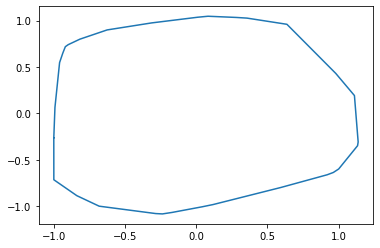

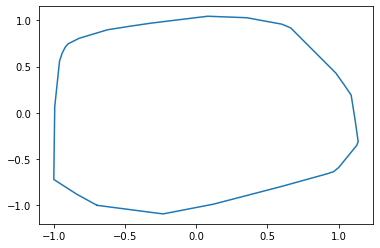

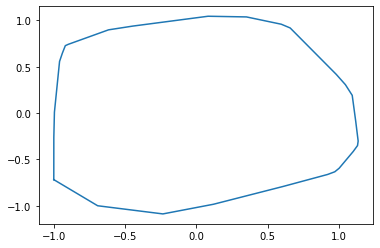

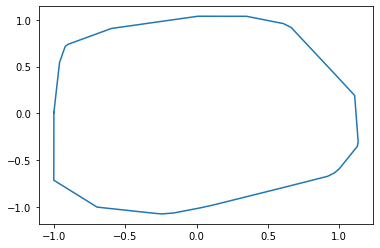

In [36]:
sa[6].summary()

## Opción 3:

Comenzamos con una discretización aleatoria de la esfera unitaria como polígono.

Tomamos dos puntos al azar en la esfera unitaria, trazamos una recta que pase por esos dos puntos y cortamos el polígono en dos. Nuestro candidato será la mitad más grande en área.

Vamos moviendo esos ángulos y cortando el polígono para mejorar la función objetiva con búsqueda local iterada.

**Desventaja**: muy codiciosa. No podemos reconstruir el polígono una vez que le sacamos un pedazo.

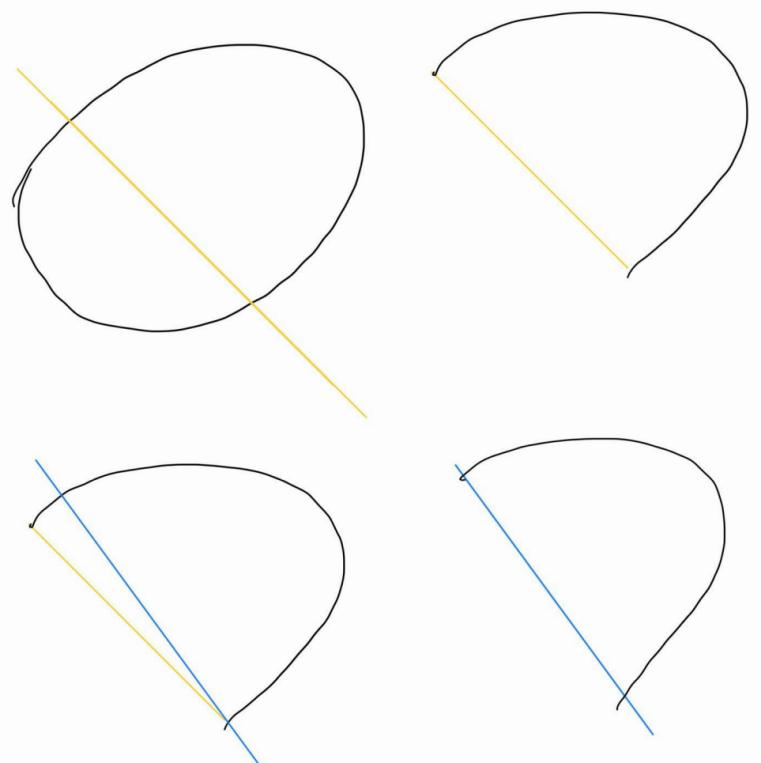

### Resultados

In [51]:
from cuts import iterated_local_search
with open('results/cuts_200_100.pkl', 'rb') as f:
    cuts_200_100 = pickle.load(f)
with open('results/cuts_300_200.pkl', 'rb') as f:
    cuts_300_200 = pickle.load(f)

Tiempo: 00:20:08
Objeto a aproximar:


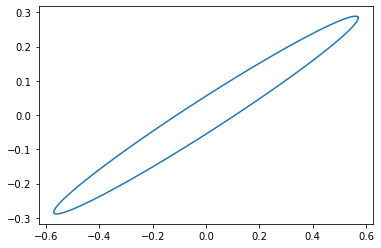

Evolución de la función objetivo:


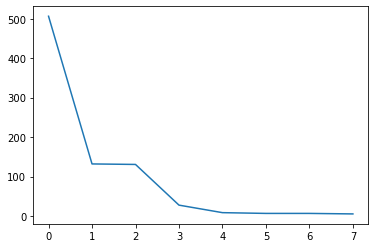

Evolución:


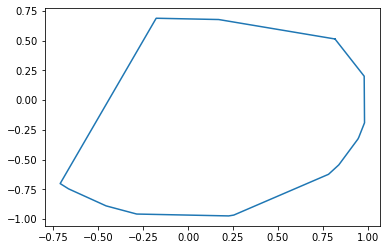

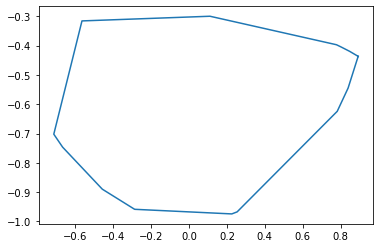

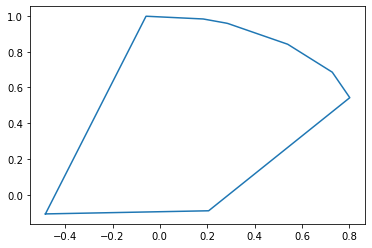

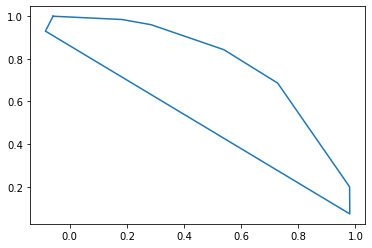

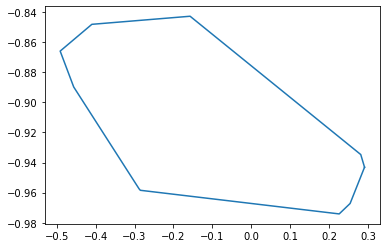

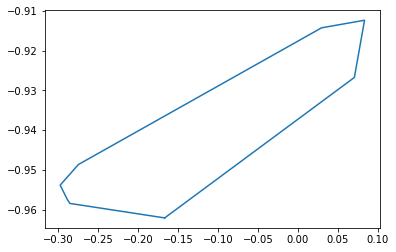

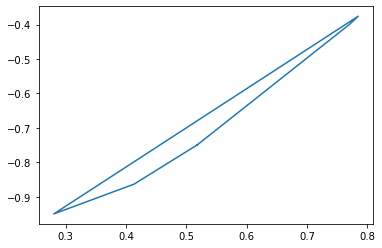

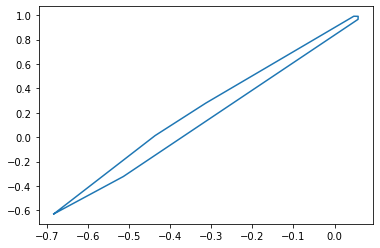

In [54]:
cuts_200_100[0].summary()

Tiempo: 00:20:04
Objeto a aproximar:


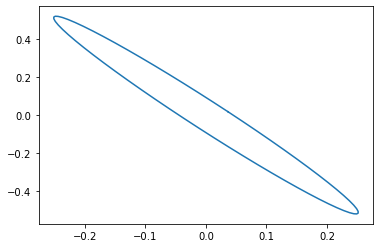

Evolución de la función objetivo:


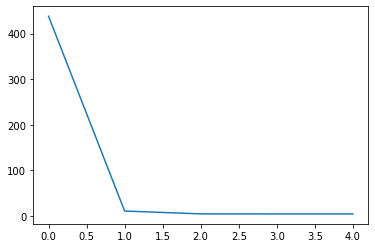

Evolución:


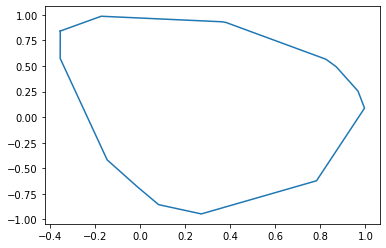

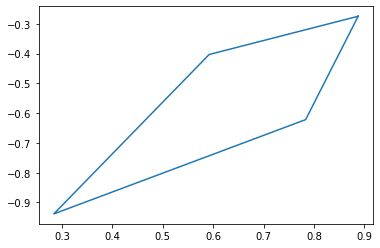

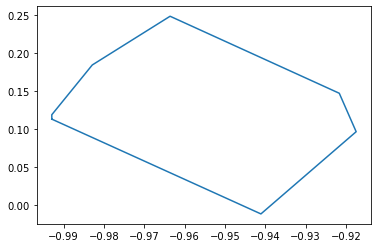

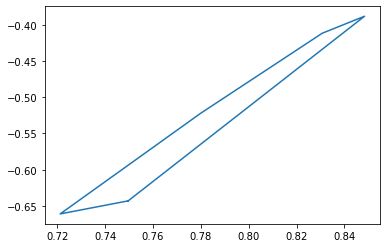

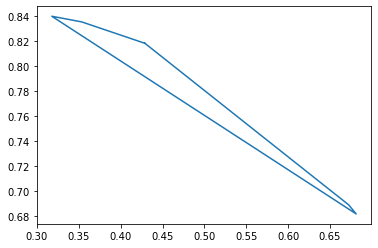

In [55]:
cuts_200_100[1].summary()

Tiempo: 00:20:07
Objeto a aproximar:


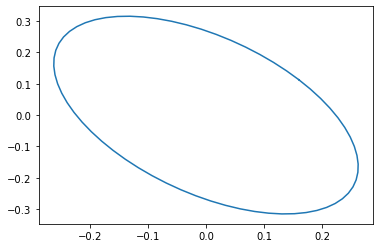

Evolución de la función objetivo:


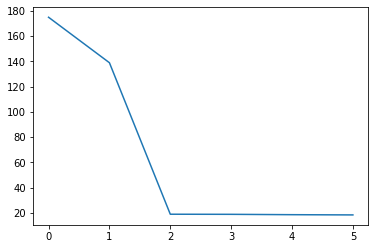

Evolución:


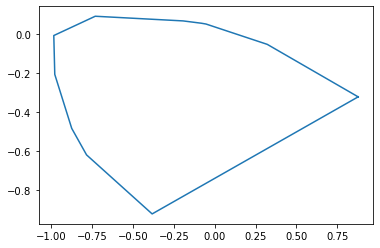

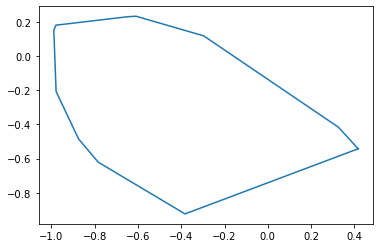

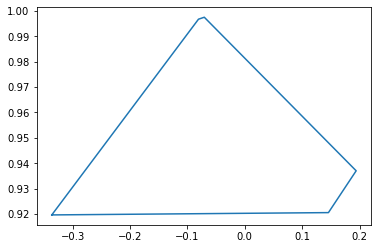

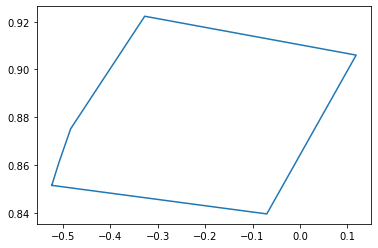

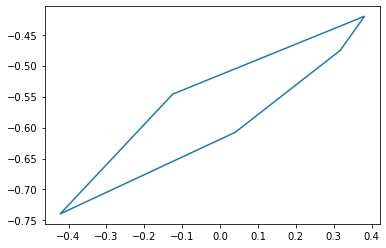

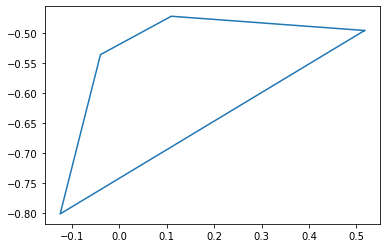

In [56]:
cuts_200_100[2].summary()

Tiempo: 00:20:21
Objeto a aproximar:


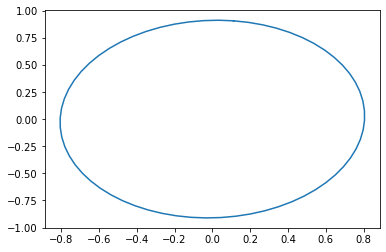

Evolución de la función objetivo:


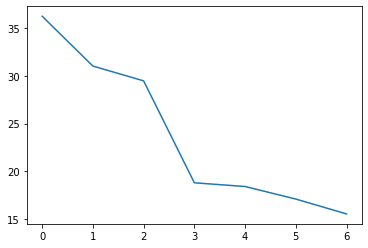

Evolución:


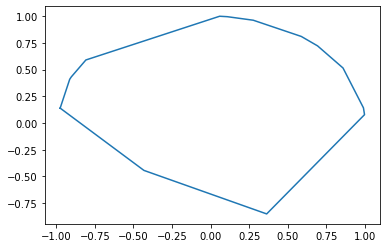

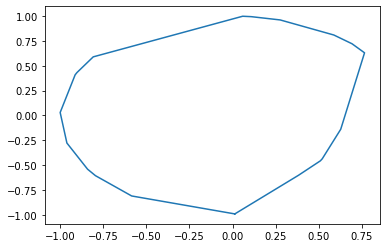

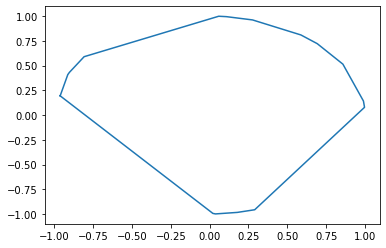

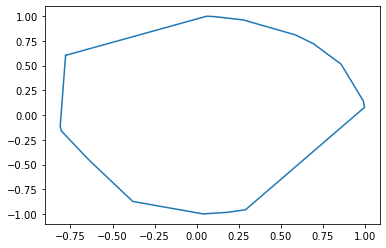

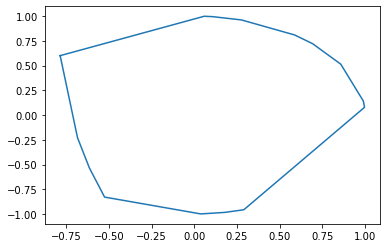

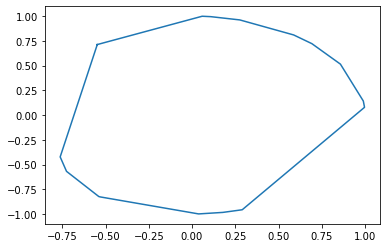

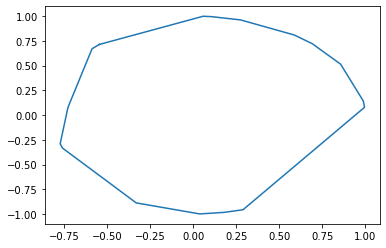

In [57]:
cuts_200_100[3].summary()

Tiempo: 00:37:07
Objeto a aproximar:


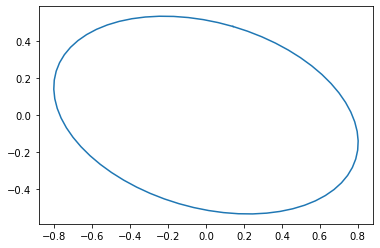

Evolución de la función objetivo:


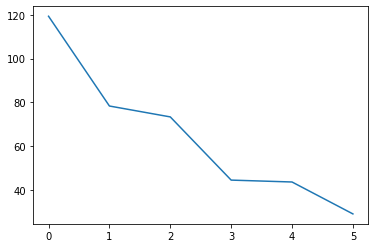

Evolución:


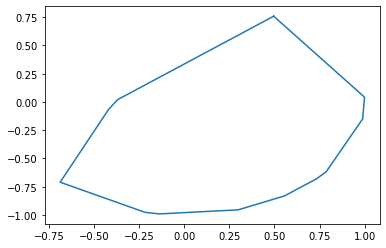

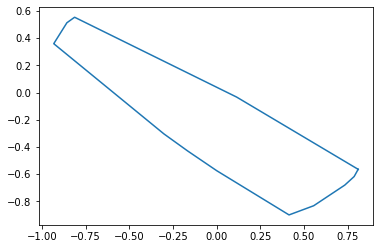

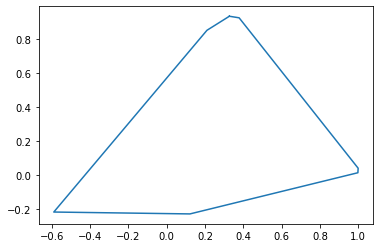

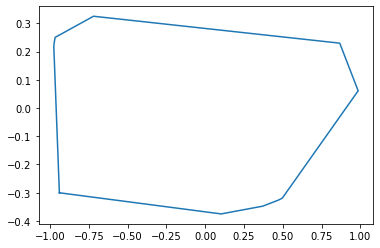

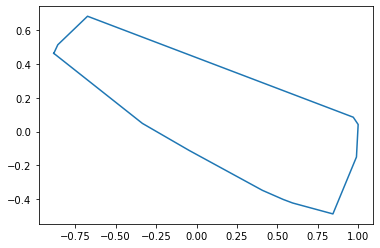

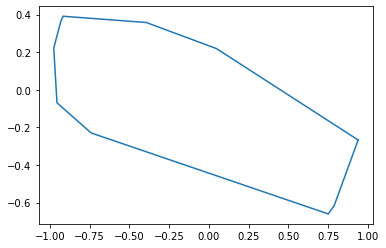

In [58]:
cuts_200_100[4].summary()

Tiempo: 00:35:14
Objeto a aproximar:


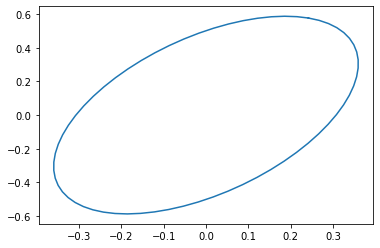

Evolución de la función objetivo:


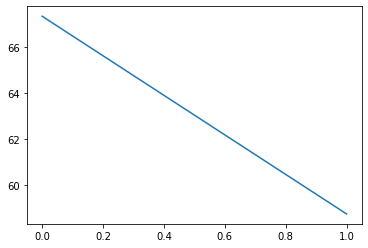

Evolución:


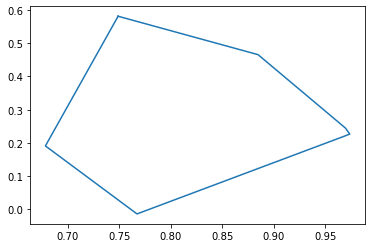

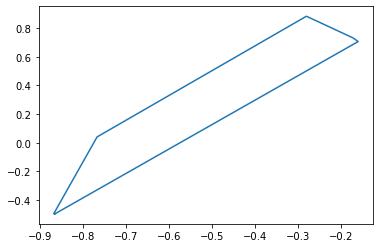

In [59]:
cuts_200_100[5].summary()

Tiempo: 00:35:54
Objeto a aproximar:


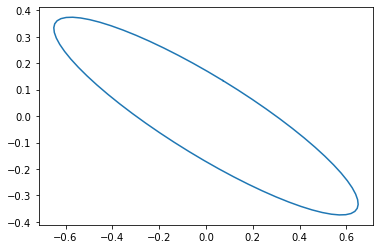

Evolución de la función objetivo:


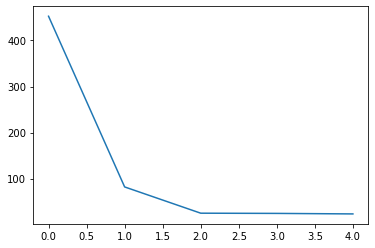

Evolución:


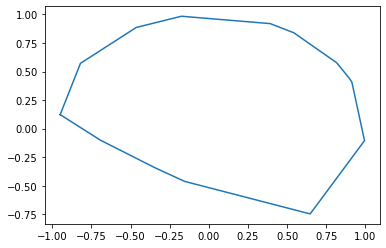

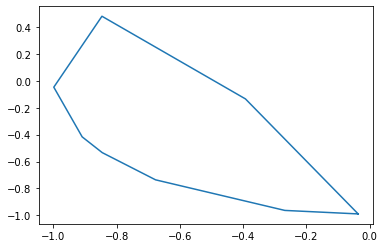

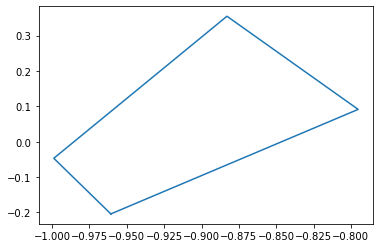

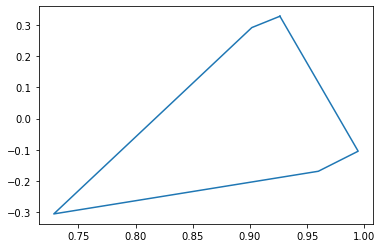

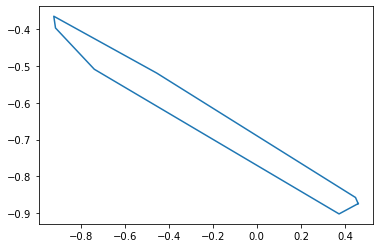

In [60]:
cuts_200_100[6].summary()

Tiempo: 01:03:14
Objeto a aproximar:


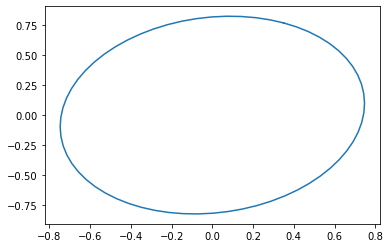

Evolución de la función objetivo:


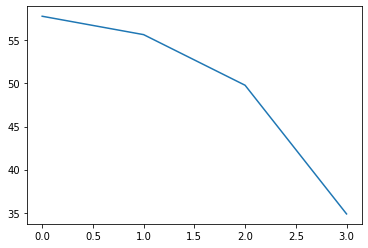

Evolución:


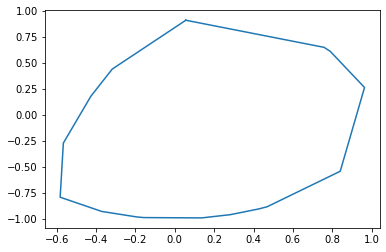

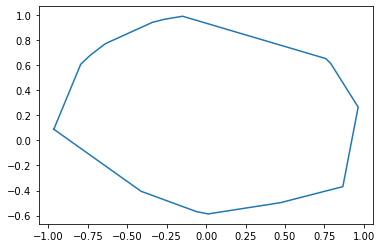

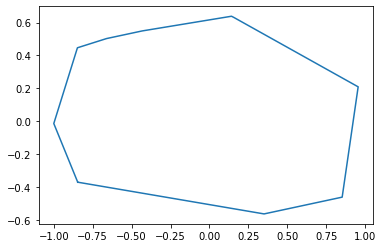

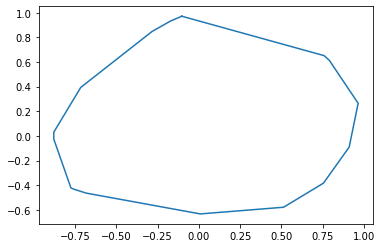

In [73]:
cuts_300_200[0].summary()

Tiempo: 01:00:44
Objeto a aproximar:


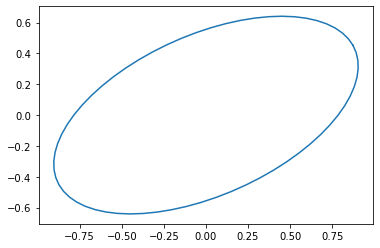

Evolución de la función objetivo:


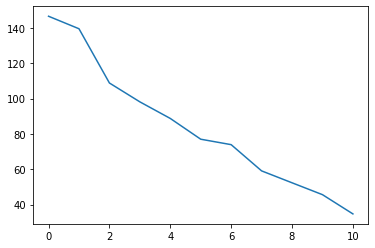

Evolución:


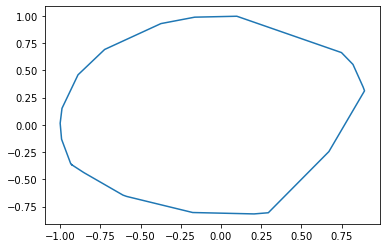

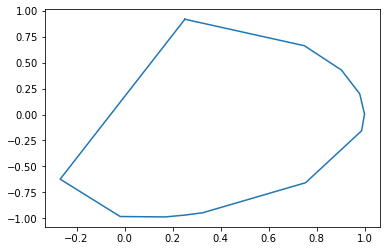

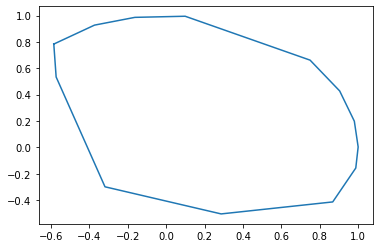

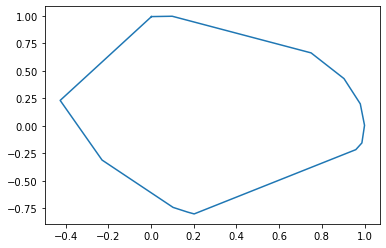

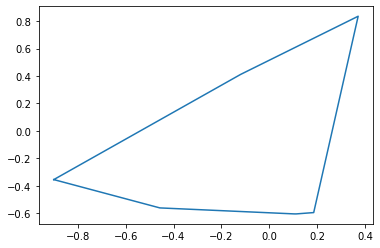

...

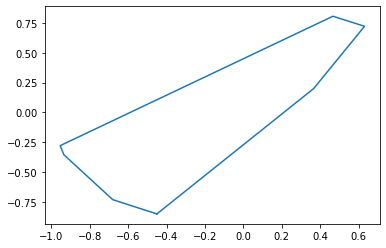

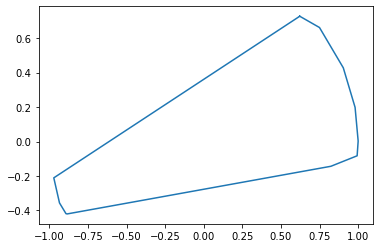

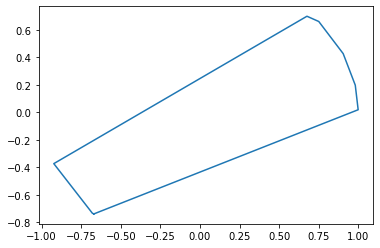

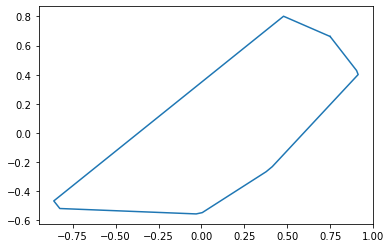

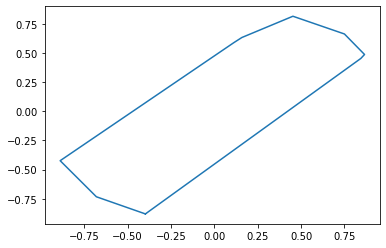

In [74]:
cuts_300_200[1].summary()

Tiempo: 01:47:57
Objeto a aproximar:


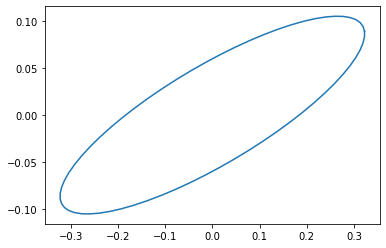

Evolución de la función objetivo:


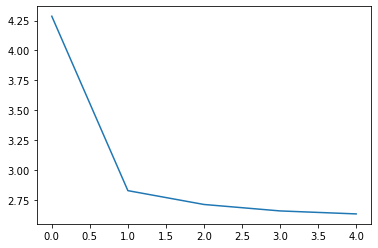

Evolución:


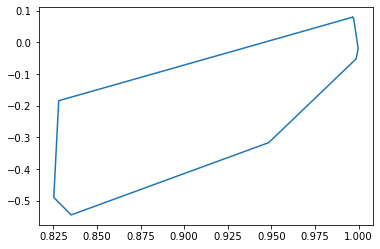

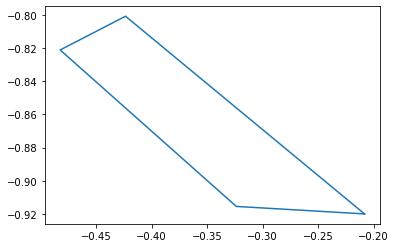

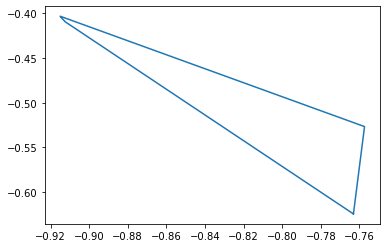

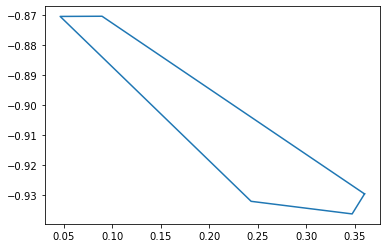

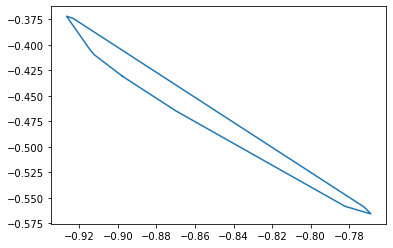

In [90]:
cuts_300_200[2].summary()

Tiempo: 01:49:30
Objeto a aproximar:


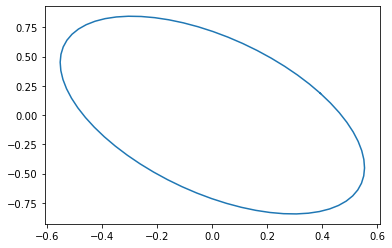

Evolución de la función objetivo:


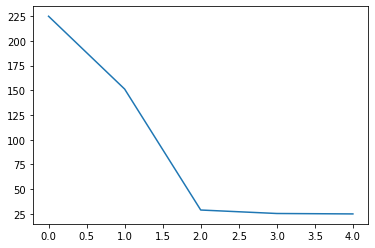

Evolución:


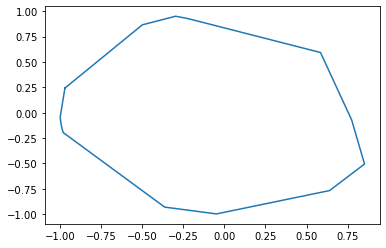

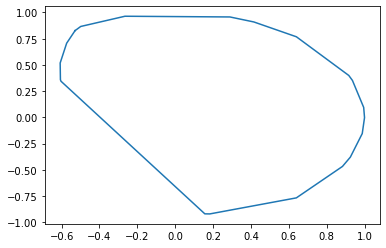

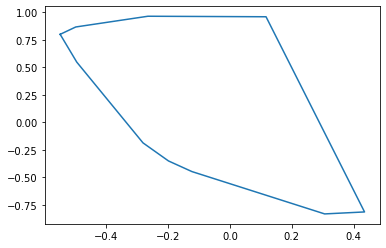

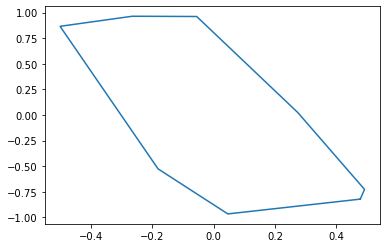

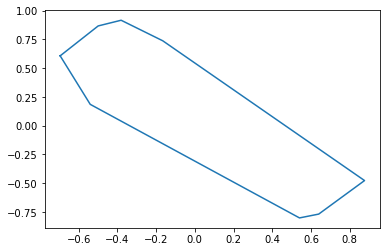

In [92]:
cuts_300_200[3].summary()

## Opción 4:

Intersecamos nuestro polígono con semiplanos de borde perpendicular a una cantidad de direcciones fijas.
$$
\theta_m= \frac{2 \pi m}{N}, 0\leq m<N
$$
Los semiplanos son $X\cdot\cos(\theta_m)+Y\cdot\sin(\theta_m)\leq b_m$ y los $b_m$ son los parámetros a optimizar con $0<b_m\leq1 \forall m$.

**Problemas**: Muchas veces hay infactibilidad, es decir que la solución de $Ax \leq b$ (con $A_i = (\cos(\theta_m), \sin(\theta_m)$ y $\theta_m = \frac{2 \pi m}{N}$) es vacía. 

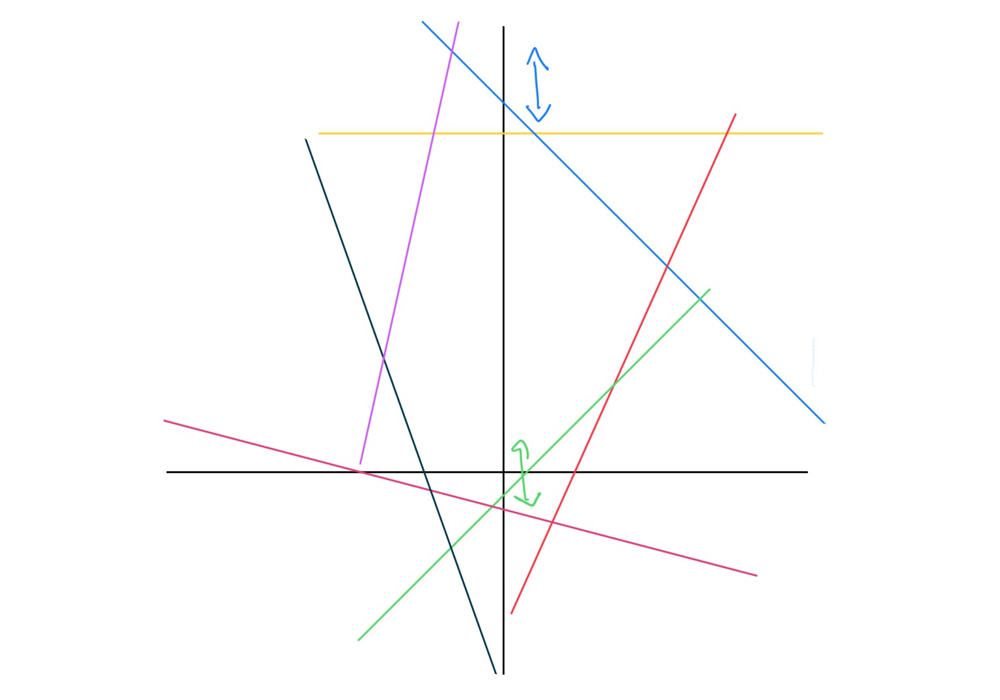

## Opción 5

Decimos que nuestro polígono será la cápsula convexa de puntos de la forma $b_m \cdot (\cos(\theta_m)\, sin(\theta_m))$ entonces nuestros parámetros a optimizar serán los $b_m$.

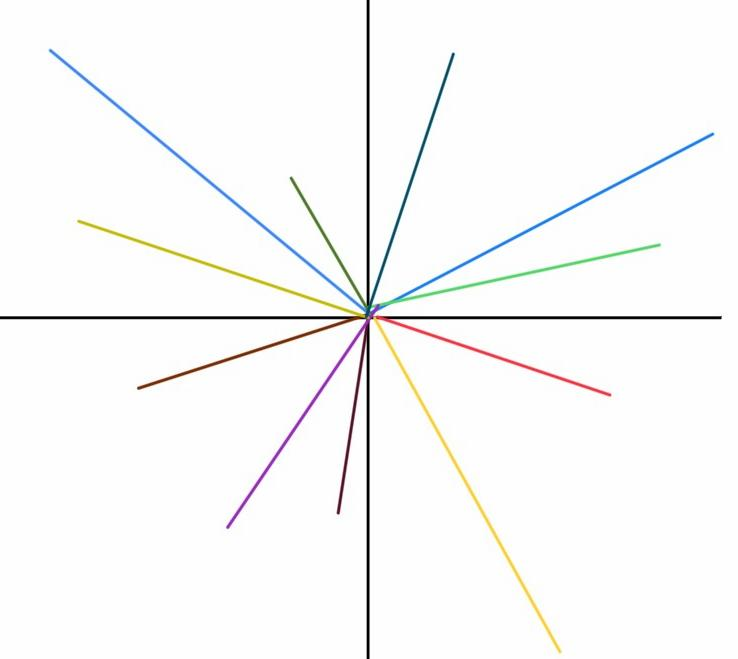